# What is a Jupyter notebook?

This page is known as a Jupyter (formerly IPython) notebook. It is an easy-to-use platform which allows coding to be interspersed with well-formatted text. For this study, I have used Python, but these pages can support a variety of other languages. 

# Project overview

*Author: Billy Raseman, Graduate Research Assistant at University of Colorado Boulder*

In this notebook, I discuss the application of the Delta Method (DM) from Chapra and DiToro (1991), an economical and simple method of estimating plant activity and reaeration, to Stroubles Creek in Blacksburg, Virginia. The estimates of primary production, respiration, and reaeration from this method were 1.87 mg/L/d, 76.2 mg/L/d, and 9 1/d, respectively. These results were supported by an estimate of reaeration based on the Owens-Gibbs formula (Owens et al. 1964) based on average stream velocity and depth. This formula produced estimates of 1.75 mg/L/d, 69.96 mg/L/d, and 8.22 1/d for primary production, respiration, and reaeration, respectively. Based on these findings, I conclude that Stroubles Creek likely has little plant activity and is impacted by sources of biological oxygen demand upstream. However, these results have significant uncertainty due to high predicted reaeration rates, the violation of the spatial uniformity assumption upstream, and an assumption of instantaneous equilibrium for saturated dissolved oxygen concentrations. In future analyses, using measured saturated dissolved oxygen and a different method which does not assume spatial uniformity would improve the reliability of the results. 

Additionally, this work provides two additional tools which may be of more general use: (1) a saturated dissolved oxygen equilibirum function, and (2) the implementation of a least-squares resgression for sinusoidal parameters--as suggested in Chapra and DiToro (1991).

## Import Python packages

In [1]:
import numpy as np     # fundamental scientific computing package
import pandas as pd    # data structures and data analysis tools 
import matplotlib.pyplot as plt  # 2D plotting library (MATLAB-like plotting framework)
import matplotlib.dates as mdates  # plot date formatting
from scipy.optimize import leastsq
import datetime as dt  # manipulating date and time data 
from IPython.display import Image  # display local image files on Jupyter notebook
from IPython.core.display import HTML  # display images from HTML links on Jupyter notebook
%matplotlib inline

# Introduction

Understanding the impact of plant activity on dissolved oxygen concentrations in streams is essential to maintain or improve aquatic ecosystems. Small streams, in particular, experience strong diurnal variation in these concentrations. Furthermore, munipalities which oversee these small streams often have limited budget and expertise to characterize these ecosystems. For these reasons, Chapra and DiToro (1993) explain that they developed the Delta Method (DM) as a simple and inexpensive way to characeterize these important parameters.  

In this notebook, I implement the DM to a small stream in Blacksburg, Virginia on Virginia Tech's campus. First, I will discuss case study location, my assumptions for the analysis, and the data used in this study. Next, I will present a saturated oxygen function that I have created for this work. And finally, I will implement the DM. The results are then analyzed and compared with reaeration estimates from the Owens-Gibbs formula. 

## Case Study Location

The Upper Stroubles Creek Watershed is roughly 1,975 acres and is fed by three natural springs: the Town, Keister-Evans and Spouts (Paraece et al., 2010). The watershed is highly urbanized (see image below from Paraece et al., 2010) and the majority of Stroubles Creek has been covered and diverted underground. Due to the poor condition of the creek, in 2002 it was added to the 303(d) list of impaired rivers in Virginia  (Parece et al., 2010). The total maximum daily load implementation plan began in 2006 (Stroubles Creek Implementation Plan Steering Committee, 2006). The wastewater treatment plant for Blacksburg discharges into the New River to the south of the town, so Stroubles Creek is unimpacted by wastewater effluent. 

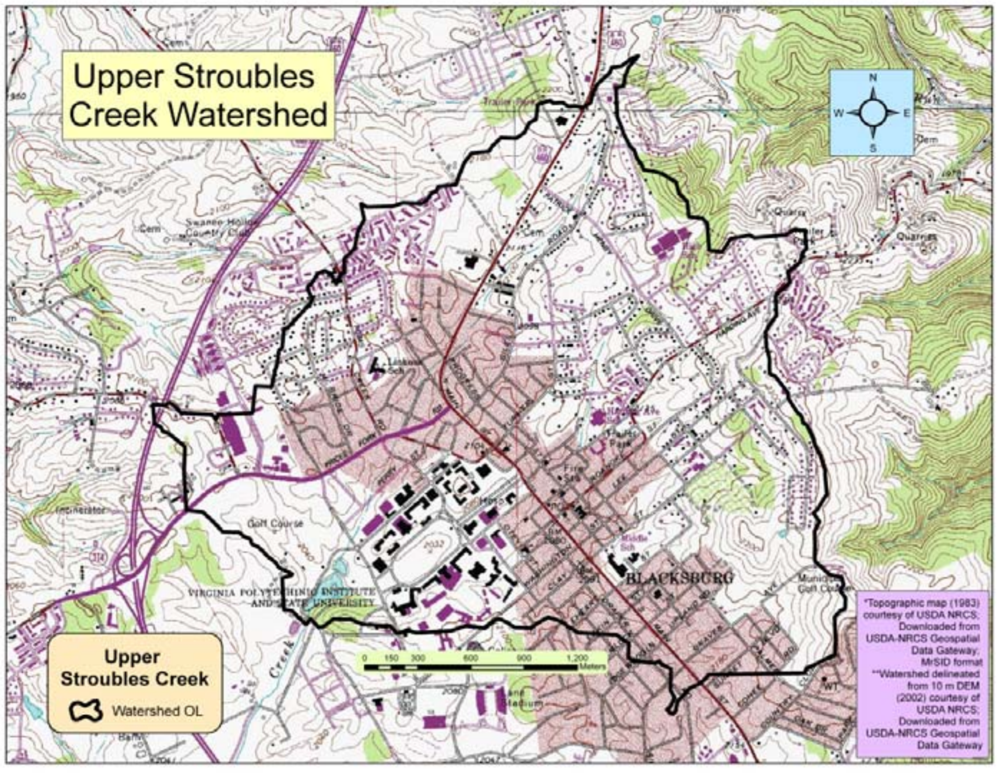

In [2]:
Image("stroubles_creek_topo.png", width=700, height=700)

# Methods

To implement the DM, the following parameters must be known:
- Solar data
    - Sunrise
    - Solar noon
    - Sunset
- Water quality data
    - Water temperature
    - Dissolved oxygen
    - Saturated dissolved oxygen

Additionally, for validation of the reaeration coefficient, following parameters must be known:
- Average stream depth
- Average velocity 

Furthermore, the assumptions made in the DM must also be met to reliably estimate primary production, respiration, and reaeration. In this section, I will discuss the data sources for the required parameters listed above and then talk about the assumptions of the model. A single day (September 20, 2014) will be analyzed for the remainder of this work. This day was chosen due to data availability, time of year, and clear weather. 

## Solar data

The solar data--time of sunrise, solar noon, and sunset--were obtained from the National Oceanic and Atmospheric Administration (NOAA) Solar Calculator (https://www.esrl.noaa.gov/gmd/grad/solcalc/). The following inputs were used (see image below):
- Blacksburg, Virginia (37.2296° N, 80.4139° W)
- Date: September 20, 2014
- Daylight Savings Time?: Yes
- Time Zone: Eastern Standard Time

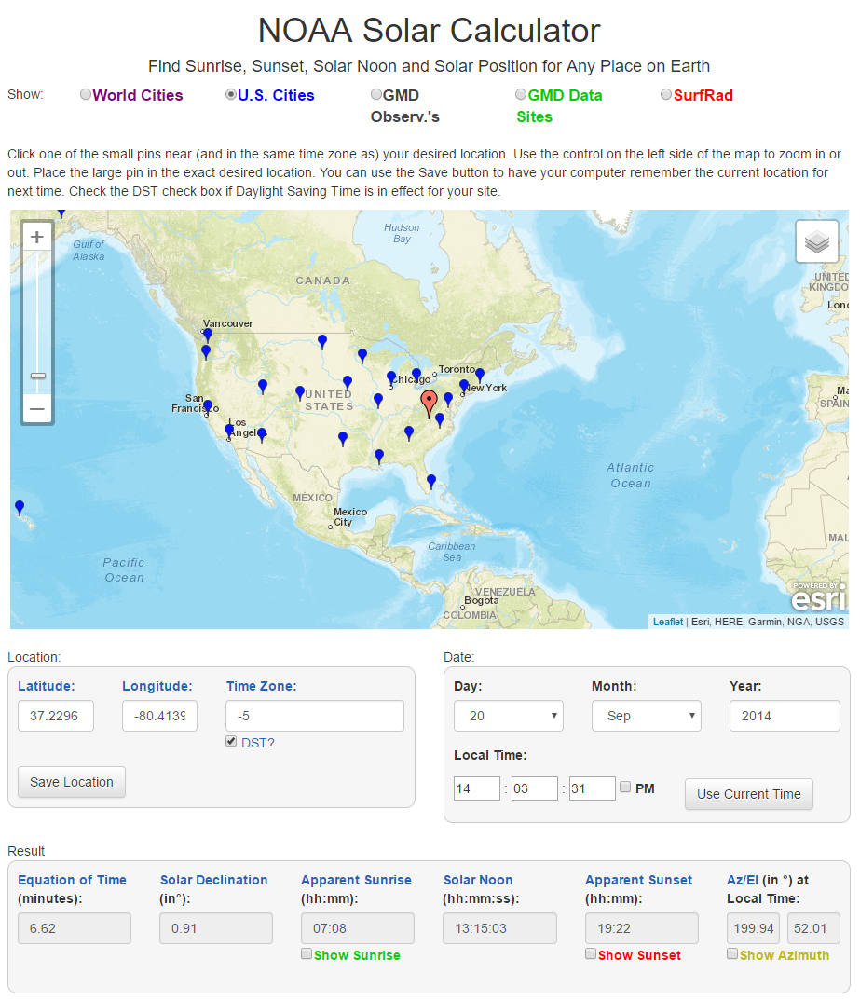

In [3]:
Image("noaa_solar-calc.png", width=700, height=700)

## Water quality data

Water quality data from Stroubles Creek is provided by the Learning Enhanced Watershed Assessment System (LEWAS) Laboratory run by Dr. Vinod Lohani and Dr. Randel Dymond. The images below are of the location of the LEWAS Lab and a schematic of its sensors and controls. 

"LEWAS is a real-time water and weather monitoring system developed to enhance water sustainability eduacation and research at Virginia Tech... [it] has sensors to measure water quality and quantity data including flow rate, depth, pH, dissolved oxygen, conductivity, and temperature." (http://www.lewas.centers.vt.edu/) The interested reader can see view a real-time web camera of the LEWAS Lab and real-time data at the aforementioned website. 

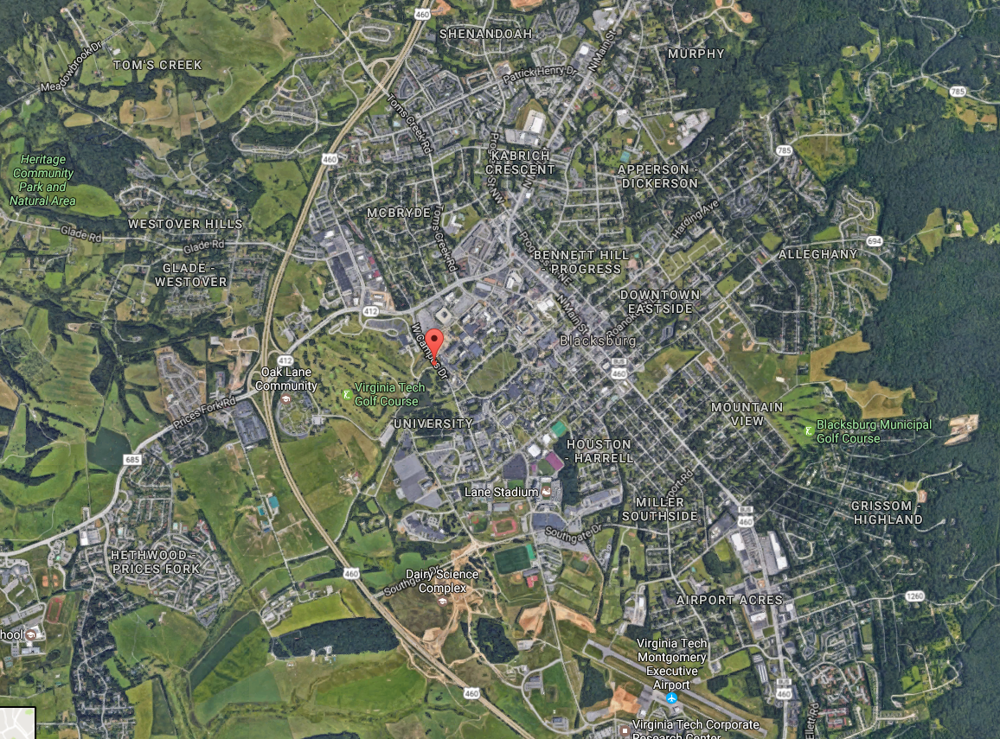

In [4]:
Image("stroubles_creek_LEWAS-lab.png", width=700, height=700)

In [5]:
Image(url= "http://www.lewas.centers.vt.edu/images/FlowDiagramWIPv2presentations-02.jpg", width=700, height=700)

## Delta Method assumptions

There are a number assumptions necessary to implement the DM. In this section, I will discuss these assumptions and whether Stroubles Creek is fit for this method. 

### Assumptions: unimpeded sunlight and no spatial variation in dissolved oxygen deficit

The DM assumes that photosynthesis can be represented as a half-sinusoid (see plot below), meaning there must be little to no cloud cover or shade to implement it. To meet this assumption, I have chosen a representative day on record (September 20, 2014) which is mostly clear; after 9:55 am, the weather is categorized as 'clear' (https://www.wunderground.com/history/airport/KBCB/2014/9/20/DailyHistory.html?req_city=&req_state=&req_statename=&reqdb.zip=&reqdb.magic=&reqdb.wmo=)

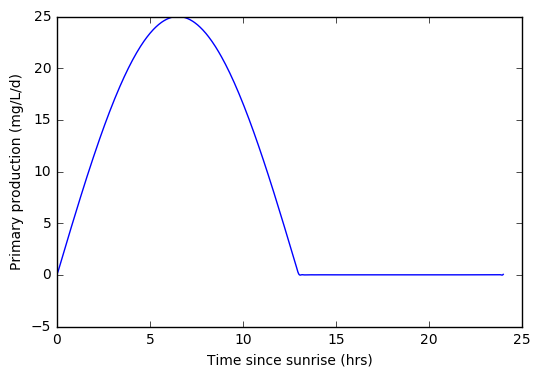

In [6]:
# sample model inputs
P_m = 25  # mg/L/d
T_p = 24  # daily period (hr)
f = 13  # photoperiod (hr)
R = 0  # respiration
k_a = 1  # aeration rate (1/d)
o_sat = 10  # oxygen saturation (mg/L)

# 100-term fourier series
time = np.arange(0, 24, 0.01)
n = np.arange(1, 101)
b_n = np.empty(len(n))  # fourier-series constant, eq. 24.28

for i in range(len(n)):
    b_n[i] = np.cos(n[i]*np.pi*f/T_p) * ( (4*np.pi*T_p/f) / ( (np.pi*T_p/f)**2 - (2*np.pi*n[i])**2) )

## primary production
P_sum = np.empty([len(n), len(time)])  # summation expression in eq. 24.27
for i in range(len(n)):
    for j in range(len(time)):
        P_sum[i, j] = b_n[i]*np.cos( 2*np.pi*n[i]/T_p * (time[j] - f/2))
        #P_sum[i, j] = b_n[i] * np.cos(2 * np.pi * n[i] / T_p * (time[j] - f / 2))

P = P_m*( 2*f/(np.pi*T_p) + np.sum(P_sum, axis = 0))
plt.plot(time, P)
plt.xlabel('Time since sunrise (hrs)')
plt.ylabel('Primary production (mg/L/d)')

The second assumption is that plants are uniformly distributed for a sufficently long distance (>3 U/k_a, or greater than three times the stream velocity over the reaeration constant). Based on an estimate of reaeration from the Owens-Gibbs formula, the necessary distance is approximately > 9500 m (see calculation below). This assumption will not be met as we know that the Upper Stroubles Creek Watershed is highly urbanized and the width of the watershed is less than 9500 m. Therefore, a more complex analysis will be necessary to more appropriately characterize this system. I will still continue with the DM application to Stroubles Creek, however, it is important to note that the spatial uniformity assumption has been violated.  

In [7]:
# since no flow data is available for 9/20/14, I used the average velocity and stage from 9/13
H = 0.383 + 0.128 # Stage(m) = FlowMeterStage(m) + 0.128, see http://www.lewas.centers.vt.edu/dataviewer/data_corrections.html
U = 0.3  # (m/s) approximated based on the relationship between stage and velocity on live LEWAS Data viewer (http://www.lewas.centers.vt.edu/dataviewer/single_graph.html)

# calculate reaeration
k_a_OG = 5.32*(U**0.67)/(H**1.85)  # reaeration rate (1/d), based on eq. 20.43 in Chapra (2008) adapted from Owens et al. (1964)
print("Reaeration coefficient predicted by Owens-Gibbs:", round(k_a_OG, 2), "1/d")

# calculate distance to satisfy uniform distribution assumption
print("> 3*U/k_a:", round(3*(U*86400)/k_a_OG, 2), "m")

Reaeration coefficient predicted by Owens-Gibbs: 8.22 1/d
> 3*U/k_a: 9456.97 m


# Results and Discussion

## Import solar data

In [8]:
# enter values from NOAA solar calculator 
t_r = dt.datetime(2014, 9, 20, 7, 8, 0)  # sunrise (hrs since midnight)
t_n = dt.datetime(2014, 9, 20, 13, 15, 3)  # solar noon (hrs since midnight)
t_s = dt.datetime(2014, 9, 20, 19, 22, 0)  # sunset (hrs since midnight)
f = t_s - t_r  # photoperiod (hrs)

## Import water quality data

In [9]:
df_wq = pd.read_csv("lewas_data-WQ_2014-09.csv")  # water quality data from September 2014
df_wq.head() # visualize the first several rows of the data

,Date,Time,Temp [deg C],pH [Units],SpCond [uS/cm],DO [mg/l],TDS [g/l]
0,9/20/2014,12:00:00 AM,18.07,8.28,674,8.13,0.4
1,9/20/2014,12:03:00 AM,18.05,8.28,675,8.12,0.4
2,9/20/2014,12:06:00 AM,18.05,8.28,675,8.15,0.4
3,9/20/2014,12:09:00 AM,18.06,8.28,675,8.15,0.4
4,9/20/2014,12:12:00 AM,18.06,8.28,676,8.14,0.4


In [10]:
df_wq['Time'] = pd.to_datetime(df_wq['Time'], format='%I:%M:%S %p').dt.time  # convert to class datetime
df_wq['Date'] = pd.to_datetime(df_wq['Date']).dt.date  # convert to class datetime
for i in range(0, len(df_wq)): 
    df_wq.loc[i, 'Datetime']= dt.datetime.combine(df_wq['Date'][i], df_wq['Time'][i])

### Calculate saturated dissolved oxygen concentration

In [11]:
def sat_dissolved_oxygen(temp_C, salinity, elev=None, pressure=None):

    """
    -------------------------------------------------------------------------------
    Purpose: Calculate the saturation dissolved oxygen (DO) for a given temperature, 
             salinity, and elevation (or pressure) at equilibrium
    Source: Chapra, S.C., 2008. Surface water-quality modeling. Waveland press.
            (all equations references are from Chapra, 2008)
    -------------------------------------------------------------------------------
    
    Input: 
        temp_C   - temperature of water in degrees Celcius       
        salinity - salinity of water in parts per thousand (ppt) 
        pressure - atmospheric pressure (atm)          [no input if elev is specified]           
        elev     - elevation above sea level (in km)   [no input if pressure is specified]     
            
    Output
        o_sat   - saturated dissolved oxygen for given input parameters (mg/L)
             
    Author: Billy Raseman
    
    """      
    
    # Convert Celcius to Kelvin
    temp_abs = temp_C + 273.15
    
    # Temperature Effect: eq 19.32
    o_sf = np.exp(-139.34411 + 1.575701e5/temp_abs - 6.642308e7/temp_abs**2 + 
               1.243800e10/temp_abs**3 - 8.621949e11/temp_abs**4)  
        # saturation conc. of dissolved oxygen (DO) in fresh water at 1 atm (mg/L)

    # Salinity Effect: eq 19.34
    o_ss = np.exp( np.log(o_sf) - salinity*(1.7674e-2 - 1.0754e1/temp_abs + 2.1407e3/temp_abs**2) )  
        # saturation conc. of DO at 1 atm accounting for any salinity (mg/L)
        # Note: if unsalinated, o_sf = o_ss

    # Pressure Effect: eq 19.39
    ## If there is no input for elevation, use pressure to calculate sat. DO
    if elev is None:
         
        ## If there is also no input for pressure, error out of function
        if pressure is None: 
            print("Error: input for either pressure or elevation is required.")
            return
        
        else:
            ## Using pressure input
            theta = 0.000975 - 1.426e-5*temp_C + 6.436e-8*temp_C**2  # fitting parameter, eq 19.38 
            pressure_wv = np.exp(11.8571 - 3840.70/temp_abs - 216961/temp_abs**2) 
                # partial pressure of water vapor (atm), eq 19.37
            o_sp = o_ss*pressure*( ((1-pressure_wv/pressure)*(1-theta*pressure)) / ((1-pressure_wv)*(1-theta)) )
                # saturation conc. of DO in water at input pressure (mg/L), eq 19.36
    
    ## For the case that there is an input for elevation
    else: 
        
        ## Using elevation input   
        o_sp = o_ss*(1 - 0.1148*elev)  
        # saturation conc. of DO in water at pressure p (or elevation elev) (mg/L)
        # Note: if at sea level, o_ss = o_sp     
        
        if pressure is not None:
            print("Ignoring pressure input, and using elevation input instead.")
            print("To use pressure calculation, delete elevation argument.")
    
    o_sat = o_sp  # these are equivalent, but o_sat is better naming convention (mg/L)
    
    return o_sat

In [12]:
df_wq['Saturated DO [mg/l]'] = "" # initialize empty array for 'for-loop'

In [13]:
# calculate saturated DO
df_wq['Saturated DO [mg/l]'] = "" # initialize empty array for 'for-loop'
salinity = 0  # assume no salinity in river
elev = 0.626  # elevation of LEWAS Lab (km)

for i in range(0, len(df_wq)): 
    df_wq.loc[i, 'Saturated DO [mg/l]'] = sat_dissolved_oxygen(df_wq.loc[i, 'Temp [deg C]'], salinity, elev)
    # for info on .loc, see: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy 

## Data exploration

Now that the necessary data has been imported and the saturated DO has been calculated, I will visualize the data in a several ways to give the reader a sense for the dynamics of the system. First, we zoom out to a six day snapshot of dissolved oxygen during a period on record that clearly exhibits a diurnal variation in dissolved oxygen. 

### Plot calculated saturated DO and observed DO for September 20-25, 2014 

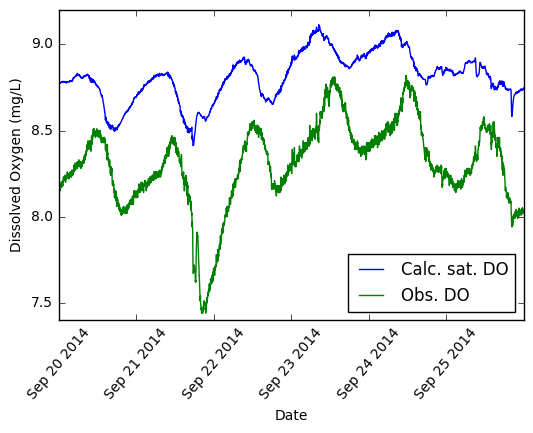

In [14]:
DO = df_wq['DO [mg/l]']
date_time = df_wq['Datetime']
plt.plot(date_time, df_wq['Saturated DO [mg/l]'])
plt.plot(date_time, DO)
plt.xticks(rotation=50)
plt.legend(['Calc. sat. DO', 'Obs. DO'], loc='lower right')
plt.xlabel('Date')
plt.ylabel('Dissolved Oxygen (mg/L)')

Based on my saturated DO calculation and the observed DO, it appears that the system is consistently undersaturation for this duration of time. Let's take a closer look a single day to understand the trends in DO and temperature. 

### Plot calculated saturated DO and observed DO for a single day (September 20, 2014)

In [15]:
df_day = df_wq[(df_wq['Date'] < dt.date(2014, 9, 21))]
date_time = df_day['Datetime']

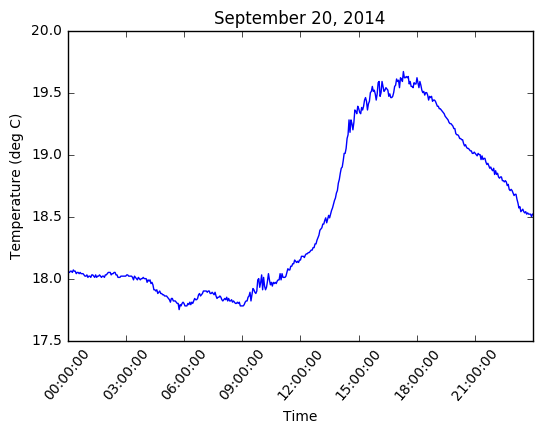

In [16]:
temp = df_day['Temp [deg C]']
plt.figure()
plt.plot(date_time, temp)
plt.xticks(rotation=50)
plt.xlabel("Time")
plt.ylabel("Temperature (deg C)")
plt.title('September 20, 2014')

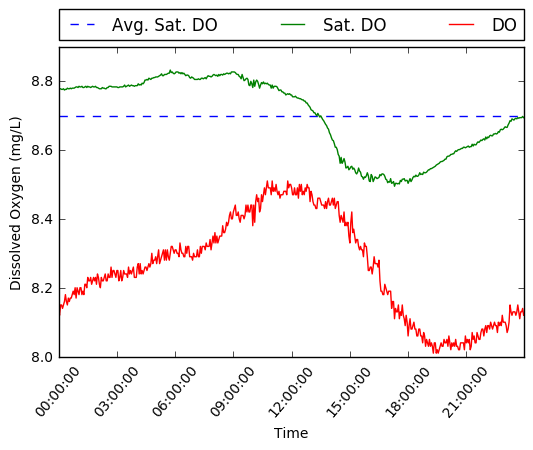

In [17]:
plt.figure()
o_sat = pd.to_numeric(df_day['Saturated DO [mg/l]'])
o_sat_avg = np.repeat(np.mean(o_sat), len(o_sat))
DO = df_day['DO [mg/l]']
date_time = df_day['Datetime']
plt.plot(date_time, o_sat_avg, '--')
plt.plot(date_time, o_sat)
plt.plot(date_time, DO)
plt.xticks(rotation=50)
plt.legend(['Avg. Sat. DO', 'Sat. DO', 'DO'], bbox_to_anchor=(0,1.02,1,0.2), loc="lower left",
                mode="expand", borderaxespad=0, ncol=3)
plt.xlabel('Time')
plt.ylabel('Dissolved Oxygen (mg/L)')

As we can see by the plots above, the temperature increases in the evening hours. In fact, the temperature profile strongly reflects the half-parabolic sunlight loading function discussed in the 'Delta Method assumptions' section with a several hours lag. This long temperature lag is likely due to the high humidity in Blacksburg. On 9/20/14, the humidity was 100% for most of the day. For this reason, we would expect to see a long lag between heat loading and temperature. 

This temperature regime causes the saturated dissolved oxygen to drop in the evening hours. As a result, the minumum dissolved oxygen value occurs in the evening instead of just before dawn. This shows qualitatively that primary production appears to have only a small impact on the stream's dissolved oxygen concentration.

After this exploration of the data, I will now apply the DM to more fully characterize the system. 

## Sequentially solve for reaeration, primary production, and respiration with delta method using look-up tables provided in Chapra and DiTorro (1991)

To apply the DM, we need to solve for the following parameters:
- D: dissolved oxygen deficit (mg/L)
- phi: time lag between solar noon and time of minimum deficit (hrs)
- delta: the range of deficit values (mg/L)

In [18]:
D = o_sat - DO  # DO deficit

In [19]:
# Find time of minimum deficit
idx_Dmin = np.where(D==D.min())[0][0]  # index corresponding to time of min. deficit
t_Dmin = date_time[idx_Dmin]  # time of minimum deficit (datetime)

idx_noon = 256  # index corresponding to time of solar noon 
t_noon =date_time[idx_noon]  # solar noon (datetime)

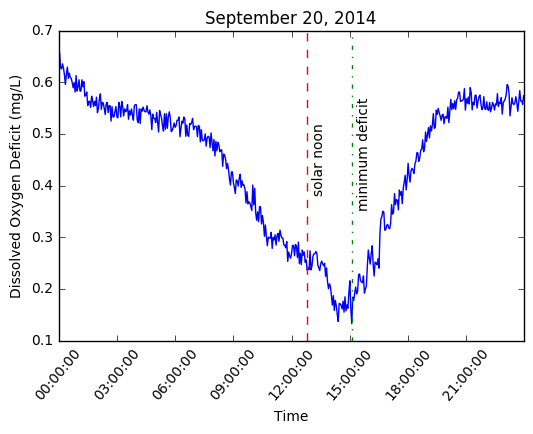

In [20]:
plt.figure()
plt.plot(date_time, D)

plt.axvline(date_time[idx_noon], linestyle='--', color='r')
plt.text(date_time[idx_noon + 5], 0.5, 'solar noon', rotation=90)

plt.axvline(t_Dmin, linestyle='-.', color='g')
plt.text(date_time[idx_Dmin + 5], 0.55, 'minimum deficit', rotation=90)

plt.xticks(rotation=50)
plt.xlabel('Time')
plt.ylabel('Dissolved Oxygen Deficit (mg/L)')
plt.title('September 20, 2014')

Above, I have calculated the dissolved oxygen deficit. Note that the deficit is not high in magnitude, suggesting a high reaeration rate. Also, there is a short time lag between solar noon and the minimum deficit (known as phi). This should raise some concern for the accuracy of our analysis as Chapra and DiTorro (1991) state that the model is extremely sensitive to errors for short time lags (i.e. streams with high reaeration > 1 1/d). 

### Solve for phi and delta

In [21]:
phi = (t_Dmin.hour + t_Dmin.minute/60 + t_Dmin.second/3600) - (t_noon.hour + t_noon.minute/60 + t_noon.second/3600)  # time lag between minimum deficit and solar noon (hrs)
print("Phi:", round(phi, 2))

delta = np.max(D) - np.min(D)  # range of deficit values (mg/L)
print("Delta:", round(delta, 2))

Phi: 2.3
Delta: 0.52


### Using time lag and photoperiod, solve for reaeration coefficient

Estimate reaeration from Figure 24.5 in Chapra (2008) based on the photoperiod (f) and time lag (phi).

In [22]:
k_a = 9  # reaeration coefficient (1/d)

### Using reaeration coefficient,  photoperiod, and delta, solve for primary production rate

Estimate average daily photosynthesis from Figure 24.6 in Chapra (2008) based on reaeration rate (k_a), f, and delta.

In [23]:
delta_over_P = 0.28  # y-axis of Figure 24.6 
P = delta/delta_over_P  # primary production rate (mg/L/d)
print("Primary production rate:", round(P, 2), "mg/L/d")

Primary production rate: 1.87 mg/L/d


### Calculate respiration

In [24]:
R = P + k_a*np.mean(DO)  # respiration (mg/L/d), equation 24.31 of Chapra (2008)
print("Respiration:", round(R, 2), "mg/L/d")

Respiration: 76.2 mg/L/d


We have now completed the DM analysis. However, there are additional models with which we can compare the results. For instance, since we have average velocity and stage data for Stroubles Creek, we can approximate the reaeration rate using the Owens-Gibbs formula (Owens et al., 1964). Using this reaeration rate, we can sequentially solve for primary production and respiration.

### Check reaeration calculation with Owens-Gibbs estimate of reaeration

In [25]:
# since no flow data is available for 9/20/14, I used the average velocity and stage from 9/13
H = 0.383 + 0.128 # Stage(m) = FlowMeterStage(m) + 0.128, see http://www.lewas.centers.vt.edu/dataviewer/data_corrections.html
U = 0.3  # approximated based on the relationship between stage and velocity on live LEWAS Data viewer (http://www.lewas.centers.vt.edu/dataviewer/single_graph.html)

# calculate reaeration
k_a_OG = 5.32*(U**0.67)/(H**1.85)  # reaeration rate (1/d), based on eq. 20.43 in Chapra (2008) adapted from Owens et al. (1964)
print("Reaeration coefficient predicted by Owens-Gibbs:", round(k_a_OG, 2), "1/d")

Reaeration coefficient predicted by Owens-Gibbs: 8.22 1/d


### Recalculate primary production and respiration based on new reaeration calculation

In [26]:
delta_over_P_2 = 0.3  # y-axis of Figure 24.6 
P_2 = delta/delta_over_P_2  # primary production rate (mg/L/d)
print("Recalculated primary production rate:", round(P_2, 2), "mg/L/d")

R_2 = P_2 + k_a_OG*np.mean(DO)  # respiration (mg/L/d), equation 24.31 of Chapra (2008)
print("Respiration:", round(R_2, 2), "mg/L/d")

Recalculated primary production rate: 1.75 mg/L/d
Respiration: 69.65 mg/L/d


From both methods, we receive similar answers. The DM predicts primary production, respiration, and reaeration of 1.87 mg/L/d, 76.2 mg/L/d, and 9 1/d, respectively. Which are within 10% of the estimates found using the Owens-Gibbs forumla: 1.75 mg/L/d, 69.96 mg/L/d, and 8.22 1/d for primary production, respiration, and reaeration, respectively. 

These results suggest that there is little plant activity in the stream, high reaeration, and a high respiration demand. This conforms with what we might expect from an impaired, urban stream like Stroubles Creek. The respiration, however, seems high based on sample values reported in Chapra (2008) which range from 5 - 16 mg/L/d in Table 24.1 and Problem 24.5. This respiration value likely represents one of two things: (1) an incorrect saturated dissolved oxygen level or (2) high levels of biological oxygen demand (BOD) from urban point sources. 

Regarding the saturated dissolved oxygen level, it is possible that the calculated values of saturation is incorrect because the stream is not necessarily at equilibrium. Based on my implementation of this calculation, I assumed that the stream reached equilibrium instantaneously. I do not know the kinetics involved in reaching saturation, and therefore, this introduces error into the analysis. I explored the idea of using an average value for the entire day, but this would have yielded a minimum deficit before solar noon which is not possible for the DM to be applied. The LEWAS Lab also has saturated DO data available, so in future analysis I would instead use that data instead of the calculated equilibrium saturated DO which is more sensitive to temperature change than the reality. 

Second, it is possible that there are urban sources of BOD that are increasing respiration. This model assumes that there are no point sources upstream that impact the stream at the monitoring location based on the spatial uniformity assumption discussed above. However, as I discussed earlier, our model does not meet that condition. Because it is unlikely that there is much aquatic life in such an impaired stream, it is probable that the upstream urban impacts are the cause of the elevated respiration. That conclusion assumes, of course, that the calculated respiration reflects the true system and is not simply an artifact of this modeling exercise. 

Other sources of error include the high reaeration rate in the sytem. As Chapra (2008) states, the model is sensitive to errors for reaeration rates >1 1/d. With an estimated reaeration of approximately 9, there is added uncertainty to our estimates. Moreover, the DM propogates uncertainty of reaeration through the rest of the estimates.   

# Conclusions

In this study, I have applied the Delta Method (DM) to Stroubles creek--an impaired, urban stream in Blacksburg, Virginia--using water quality data from the LEWAS Lab at Virginia Tech. The LEWAS data shows that the dissolved oxygen concentration is relatively consistent throughout the data, although there is a clear diurnal signal. The results from the DM analysis suggest that there is limited plant activity and high levels of respiration, although this respiration is more likely due to the impacts of biological oxygen demand loading upstream than aquatic life. Although the DM gives us intuition about the stream processes, a number of errors and uncertainties were present in the analysis. Thus, to better characeterize the system, more sophisticated methods are necessary. 

# Additional Material

I also explored the use of least-squares regression to fit a sinusoid to the dissolved oxygen data. Chapra (2008) suggests this method for the estimation of DM parameters to remove subjectivity. However, for the case of Stroubles Creek, the sinusoid did not appear to be a good enough approximation of the data as it dampened the true DO trend (see below). This would have altered the estimated time lag. Since the time lag was so short in this system, the results would have been extremely sensitive to this change. Nonetheless, I wanted to display the results of that exercise as the least-squares regression can likely be applied to other streams.

## Fit observed DO to sine curve by least-squares regression

Amplitude:  0.190465306096
Phase:  -1.10296876493
Mean:  8.25837499962


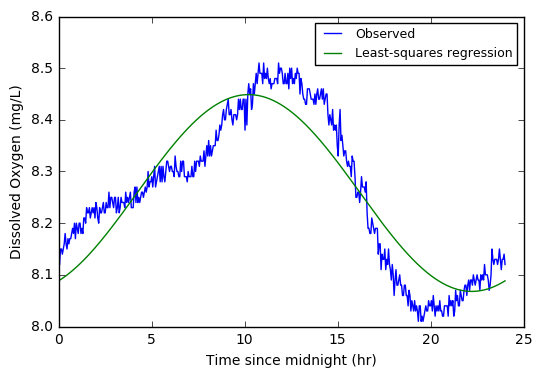

In [27]:
# source: http://stackoverflow.com/questions/16716302/how-do-i-fit-a-sine-curve-to-my-data-with-pylab-and-numpy by Dhara. accessed: 5/1/17

# inputs for sine fitting (user can change these!)
data = df_day['DO [mg/l]']  # dissolved oxygen (mg/L)
period = 1  # assume only 1 period for one day

# guesses for three fitting parameters: mean, amplitude, and phase
guess_mean = np.mean(data)
guess_amp = 3*np.std(data)/(2**0.5)
guess_phase = 0

t = np.linspace(0, 2*np.pi*period, len(data))
data_first_guess = guess_amp*np.sin(t+guess_phase) + guess_mean

# Define the function to optimize, in this case, we want to minimize the difference
# between the actual data and our "guessed" parameters

optimize_func = lambda x: x[0]*np.sin(t+x[1]) + x[2] - data
est_amp, est_phase, est_mean = leastsq(optimize_func, [guess_amp, guess_phase, guess_mean])[0]

print("Amplitude: ", est_amp)
print("Phase: ", est_phase)
print("Mean: ", est_mean)

# recreate the fitted curve using the optimized parameters
data_fit = est_amp*np.sin(t+est_phase) + est_mean

time = np.linspace(0, 24, len(data))
plt.plot(time, data, label='Observed')
plt.plot(time, data_fit, label='Least-squares regression')
plt.xlabel('Time since midnight (hr)')
plt.ylabel('Dissolved Oxygen (mg/L)')
plt.legend(prop={'size':9})
plt.show()

# References

Chapra, Steven C., and Dominic M. Di Toro. “Delta Method for Estimating Primary Production, Respiration, and Reaeration in Streams.” Journal of Environmental Engineering 117, no. 5 (1991): 640–655.

Chapra, Steven C. Surface Water-Quality Modeling. Waveland Press, 2008.

Owens, Moriais, R. W. Edwards, and J. W. Gibbs. “Some Reaeration Studies in Streams.” Air and Water Pollution 8 (1964): 469.

Parece, Tammy, Stephanie DiBetitto, Tiffany Sprague, and Tamim Younos. “The Stroubles Creek Watershed: History of Development and Chronicles of Research,” 2010. https://www.researchgate.net/profile/Tammy_Parece/publication/264477332_The_Stroubles_Creek_Watershed_History_of_Development_and_Chronicles_of_Research/links/53e0e2590cf2235f35270de6.pdf.

Stroubles Creek Implementation Plan Steering Committee. “Upper Stroubles Creek Watershed TMDL Implementation Plant Montgomery County, Virginia,” May 24, 2006. http://www.deq.virginia.gov/Portals/0/DEQ/Water/TMDL/ImplementationPlans/stroubip.pdf.
